In [1]:
from ipaddress import summarize_address_range
from scipy.io import mmread
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scanpy
import scvelo as scv
import sys
#srcdir = '/Users/shengyuli/Library/CloudStorage/OneDrive-HoustonMethodist/work/Velocity/bin/cellDancer_polish/src'
srcdir = '/Users/wanglab/Documents/ShengyuLi/Velocity/bin/celldancer_polish/src'
sys.path.append(srcdir)
from celldancer.cdplt import colormap


In [3]:
adata=scv.datasets.dentategyrus_lamanno()

100%|████████████████████████████████████████| 249M/249M [00:17<00:00, 15.3MB/s]
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
... storing 'Age' as categorical
... storing 'Cell_Conc' as categorical
... storing 'ChipID' as categorical
... storing 'ClusterName' as categorical
... storing 'Comments' as categorical
... storing 'Date_Captured' as categorical
... storing 'DonorID' as categorical
... storing 'Label' as categorical
... storing 'NGI_PlateWell' as categorical
... storing 'Num_Pooled_Animals' as categorical
... storing 'PCR_Cycles' as categorical
... storing 'Plug_Date' as categorical
... storing 'Project' as categorical
... storing 'SampleID' as categorical
... storing 'SampleOK' as categorical
... storing 'Sample_Index' as categorical
... storing 'Seq_Comment' as categorical
... storing 'Seq_Lib_Date' as categorical
... storing 'Seq_Lib_Ok' as categorical
... storing 'Serial_Number' as categorical
... storing 'Sex' as categorical
... storin

In [4]:
scanpy(adata)

AnnData object with n_obs × n_vars = 18213 × 27998
    obs: 'Age', 'clusters'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'clusters_colors'
    obsm: 'X_tsne'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [74]:
#DentateGyrus=pd.read_csv('/Users/shengyuli/Library/CloudStorage/OneDrive-HoustonMethodist/work/Velocity/data/raw_data/DentateGyrus.csv')
DentateGyrus=pd.read_csv('/Users/wanglab/Documents/ShengyuLi/Velocity/data/raw_data/DentateGyrus.csv')
kept_genes=list(DentateGyrus.gene_name.drop_duplicates())
kept_cells=list(DentateGyrus[DentateGyrus.gene_name=='Rgs20'].cellID)

In [185]:
adata_paper

AnnData object with n_obs × n_vars = 18213 × 27998
    obs: 'Age', 'Cell_Conc', 'ChipID', 'ClusterName', 'Clusters', 'Comments', 'Date_Captured', 'DonorID', 'Label', 'NGI_PlateWell', 'Num_Pooled_Animals', 'PCR_Cycles', 'Plug_Date', 'Project', 'SampleID', 'SampleOK', 'Sample_Index', 'Seq_Comment', 'Seq_Lib_Date', 'Seq_Lib_Ok', 'Serial_Number', 'Sex', 'Species', 'Strain', 'TSNE1', 'TSNE2', 'Target_Num_Cells', 'Tissue', 'Transcriptome', 'cDNA_Lib_Ok', 'ngperul_cDNA', 'celltype'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    obsm: 'X_umap'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [188]:
adata_paper.layers['spliced']


<18213x27998 sparse matrix of type '<class 'numpy.uint16'>'
	with 35718941 stored elements in Compressed Sparse Row format>

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Please `pip install adjustText` for auto-aligning texts


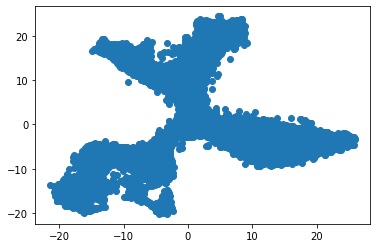

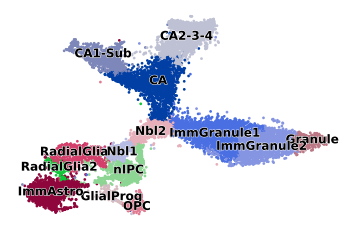

In [81]:
# neuro data 
#adata_paper =scanpy.read ('/Users/shengyuli/Library/CloudStorage/OneDrive-HoustonMethodist/work/Velocity/data/velocyto/neuro/raw_data/DentateGyrus.loom')
adata_paper =scanpy.read('/Users/wanglab/Documents/ShengyuLi/Velocity/data/raw_data/other_format/velocyto_format/DentateGyrus.loom')
adata_paper.var_names_make_unique
adata_paper.obs['ClusterName']
plt.scatter(adata_paper.obs['TSNE1'],adata_paper.obs['TSNE2'])
adata_paper.obsm['X_umap']=adata_paper.obs[['TSNE1','TSNE2']].to_numpy()
adata_paper.obs['celltype']=adata_paper.obs['ClusterName']
adata=adata_paper[adata_paper.obs.index.isin(kept_cells),adata_paper.var.index.isin(kept_genes)].copy()
adata.var_names_make_unique()
scv.pl.scatter(adata, c='celltype', s=30, legend_align_text=True, legend_fontsize=12, title='')
#scv.pp.filter_and_normalize(adata_paper, min_shared_counts=30, n_top_genes=2000)

In [82]:
scv.tl.velocity(adata, vkey='steady_state_velocity', mode='steady_state')
scv.tl.velocity_graph(adata, vkey='steady_state_velocity',n_jobs=20)

Normalized count data: X, spliced, unspliced.
computing neighbors
    finished (0:00:01) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:01) --> added 
    'steady_state_velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 20/48 cores)
    finished (0:00:56) --> added 
    'steady_state_velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [83]:
scv.tl.velocity(adata, vkey='stochastic_velocity', mode='stochastic')
scv.tl.velocity_graph(adata, vkey='stochastic_velocity',n_jobs=20)

computing velocities
    finished (0:00:07) --> added 
    'stochastic_velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 20/48 cores)
    finished (0:00:56) --> added 
    'stochastic_velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [84]:
scv.tl.recover_dynamics(adata,n_jobs=20)

recovering dynamics (using 20/48 cores)
    finished (0:03:44) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [85]:
scv.tl.velocity(adata, mode='dynamical', vkey='dynamical_velocity')

computing velocities
    finished (0:00:39) --> added 
    'dynamical_velocity', velocity vectors for each individual cell (adata.layers)


In [86]:
scv.tl.velocity_graph(adata, vkey='dynamical_velocity', variance_stabilization=True,n_jobs=20)

computing velocity graph (using 20/48 cores)
    finished (0:00:59) --> added 
    'dynamical_velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:03) --> added
    'dynamical_velocity_umap', embedded velocity vectors (adata.obsm)


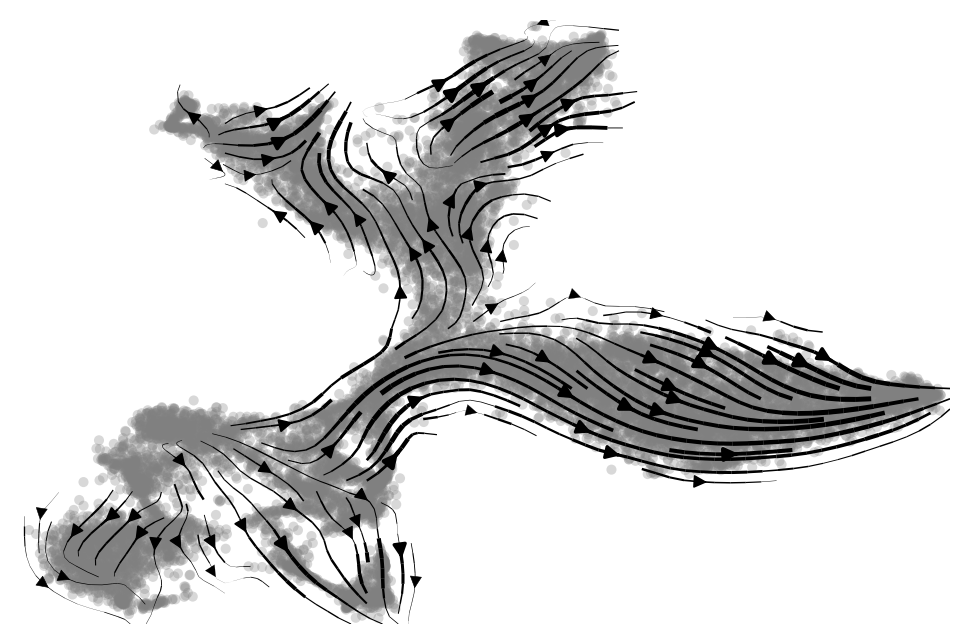

In [87]:
scv.pl.velocity_embedding_stream(adata, vkey='dynamical_velocity', dpi=200)

computing velocity embedding
    finished (0:00:03) --> added
    'steady_state_velocity_umap', embedded velocity vectors (adata.obsm)


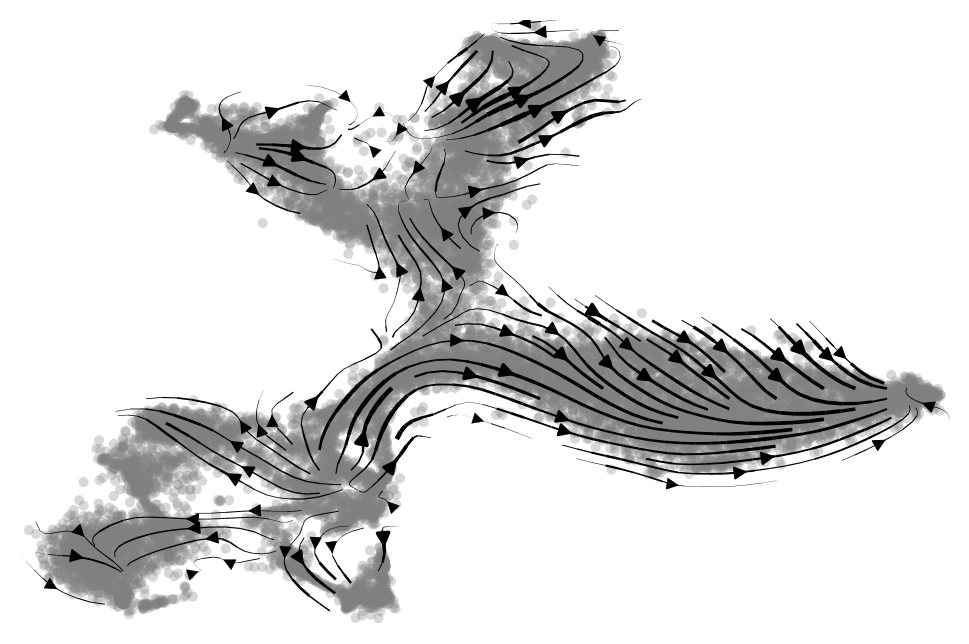

In [88]:
scv.pl.velocity_embedding_stream(adata, vkey='steady_state_velocity', dpi=200)


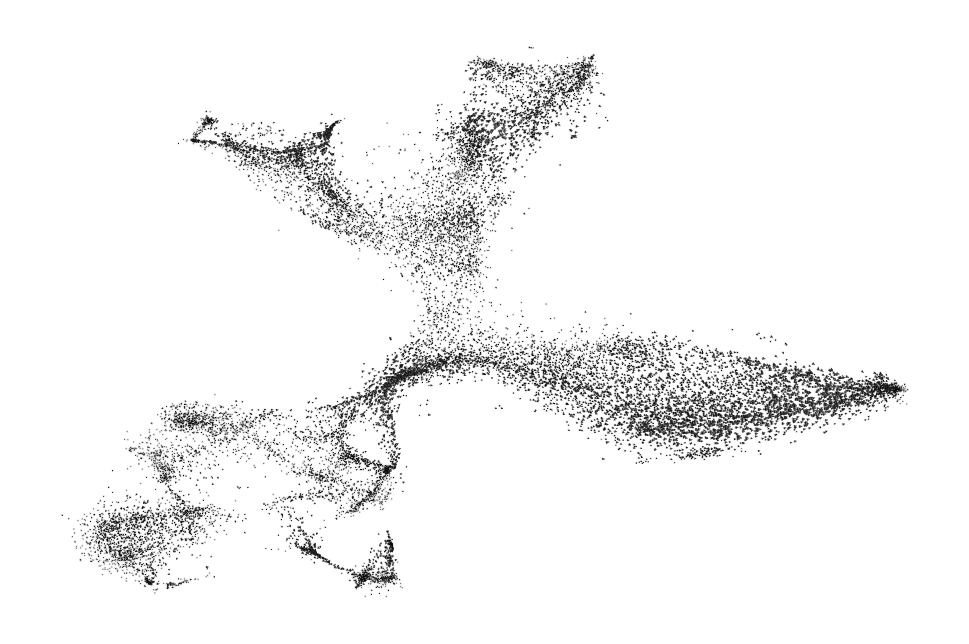

In [89]:
X_dynamic,V_dynamic=scv.pl.velocity_embedding(adata, vkey='dynamical_velocity', scale=0.5, dpi=200)

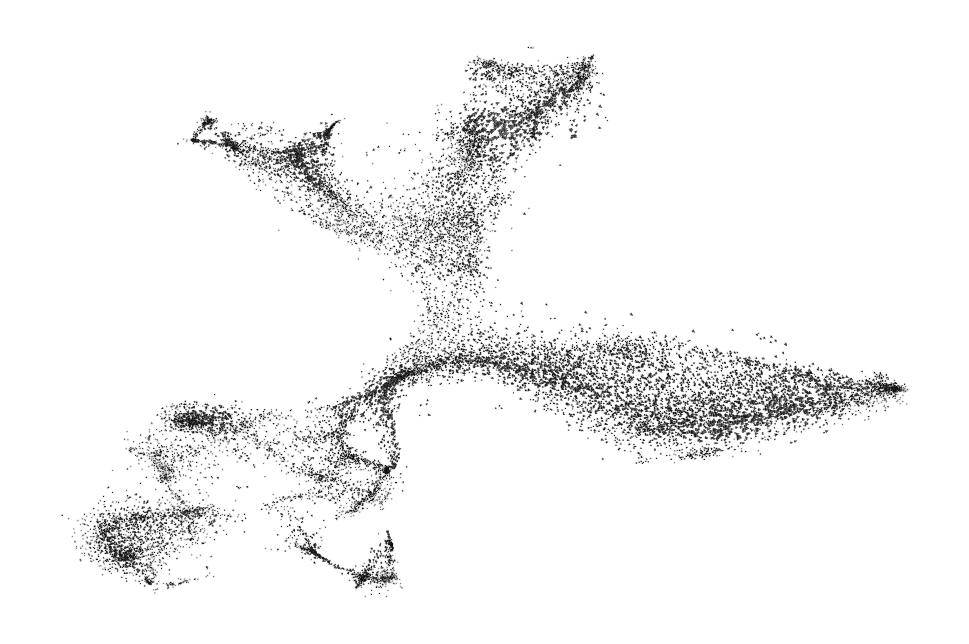

In [90]:
X_steady,V_steady=scv.pl.velocity_embedding(adata, vkey='steady_state_velocity', scale=0.5, dpi=200)

In [92]:
scv_cell_velocity_dy=pd.DataFrame({'embedding1':X_dynamic[:,0],'embedding2':X_dynamic[:,1],'embedding1_scv':V_dynamic[:,0],'embedding2_scv':V_dynamic[:,1]})
scv_cell_velocity_st=pd.DataFrame({'embedding1':X_steady[:,0],'embedding2':X_steady[:,1],'embedding1_scv':V_steady[:,0],'embedding2_scv':V_steady[:,1]})

In [93]:
scv_cell_velocity_dy.to_csv('/Users/wanglab/Documents/ShengyuLi/Velocity/data/neuro/scvelo_prediction/cell_velocity_scv_dy.csv',index=False)
scv_cell_velocity_st.to_csv('/Users/wanglab/Documents/ShengyuLi/Velocity/data/neuro/scvelo_prediction/scv_cell_velocity_st.csv',index=False)

In [94]:
from celldancer.sampling import sampling_neighbors
from sklearn.neighbors import NearestNeighbors
# load raw
raw_data_path = "/Users/wanglab/Documents/ShengyuLi/Velocity/data/raw_data/DentateGyrus.csv"
load_raw_data = pd.read_csv(raw_data_path)

0.359682467548906
2.5412986663637636
7.065394884776316


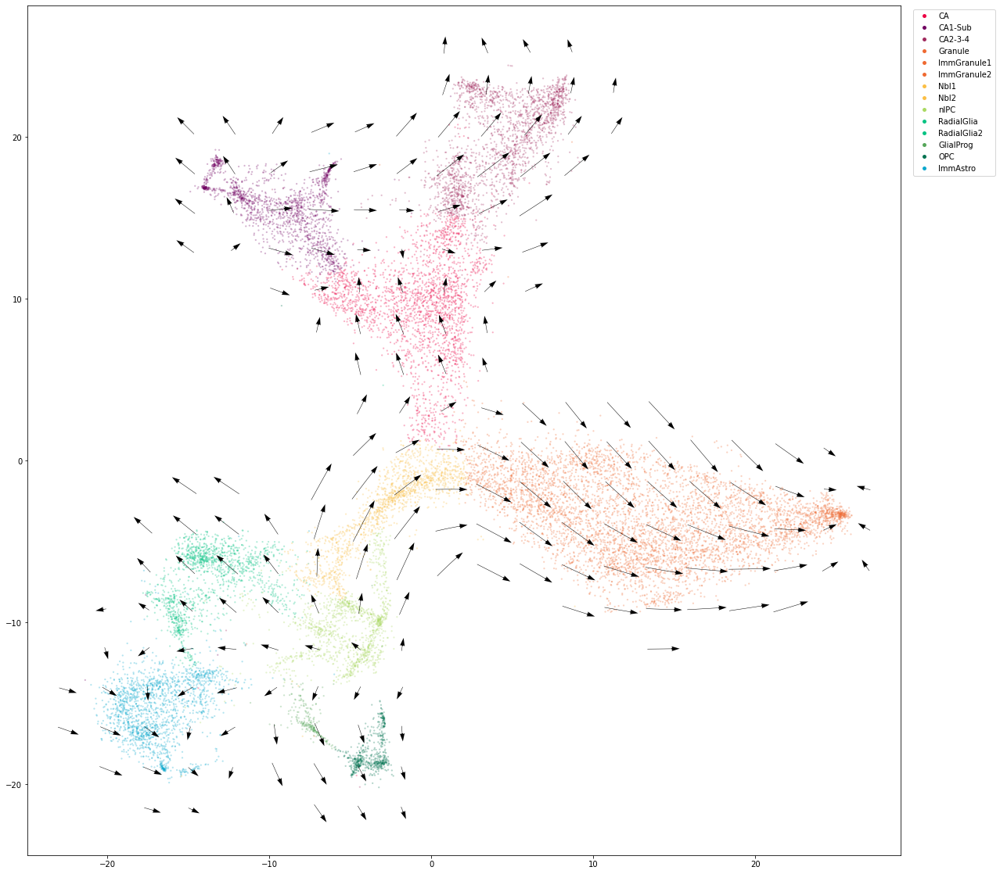

In [109]:
colors = colormap.colormap_neuro
import os
# save_path='/Users/wanglab/Documents/ShengyuLi/Velocity/data/Gastrulation/velocity_result/scvelo/cell_velocity'
save_path='/Users/wanglab/Documents/ShengyuLi/Velocity/data/neuro/scvelo_prediction'

velocity_cell_map_curve_scv(X_steady[X_steady[:,1] >-100],V_steady[X_steady[:,1] >-100], X_steady[:,1]>-100,load_raw_data,colors=colors,min_mass=10,grid_steps=(20,20),alpha_inside=0.3,save_path=save_path)

0.3823566184413125
2.5412986663637636
6.646409513514998


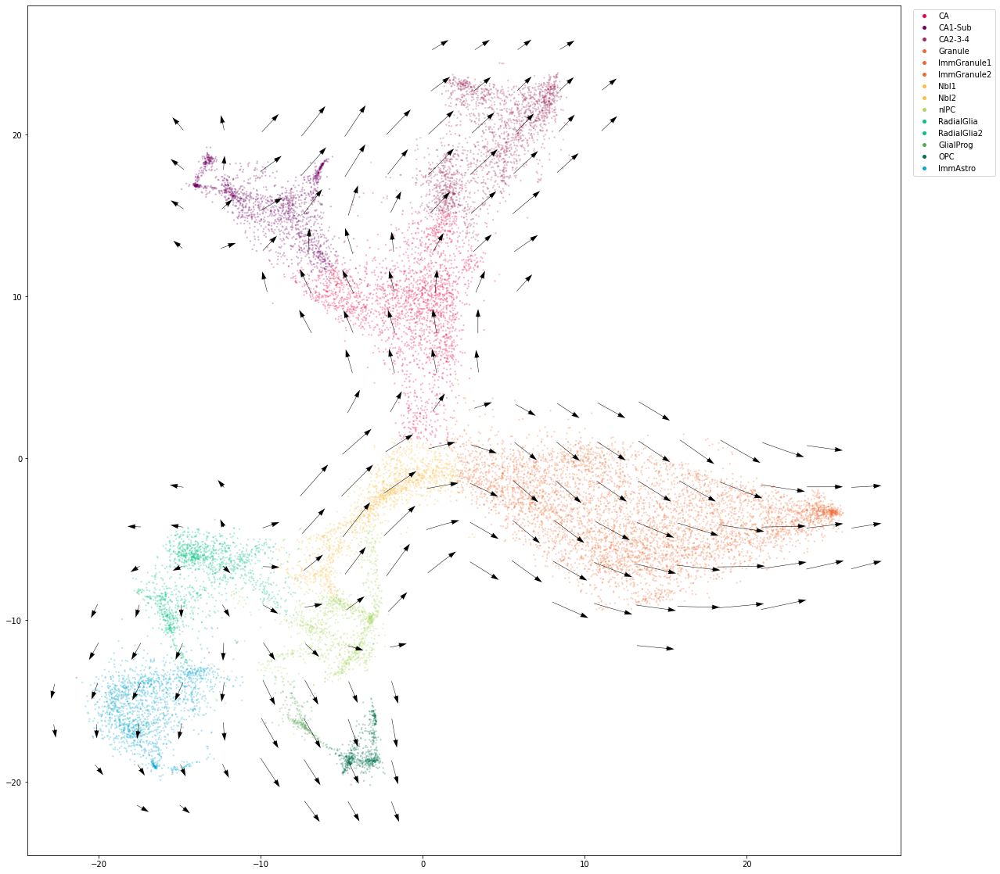

In [110]:
colors = colormap.colormap_neuro
import os
# save_path='/Users/wanglab/Documents/ShengyuLi/Velocity/data/Gastrulation/velocity_result/scvelo/cell_velocity'
save_path='/Users/wanglab/Documents/ShengyuLi/Velocity/data/neuro/scvelo_prediction'

velocity_cell_map_curve_scv(X_dynamic[X_dynamic[:,1] >-100],V_dynamic[X_dynamic[:,1] >-100], X_dynamic[:,1]>-100,load_raw_data,colors=colors,min_mass=10,grid_steps=(20,20),alpha_inside=0.3,save_path=save_path)

In [150]:
adata_branch=adata[adata.obs.index.isin(kept_cells),adata.var.index.isin(kept_genes)].copy()
adata_branch.var_names_make_unique()

In [132]:
branch_genes=pd.read_csv('/Users/wanglab/Documents/ShengyuLi/Velocity/bin/celldancer_polish/analysis/analysis_wq/classification/branch_gene_list.txt',header=None,sep=" ")[0]

In [151]:
adata_branch=adata_branch[:,adata_branch.var.index.isin(branch_genes)]
adata_branch


View of AnnData object with n_obs × n_vars = 18140 × 187
    obs: 'Age', 'Cell_Conc', 'ChipID', 'ClusterName', 'Clusters', 'Comments', 'Date_Captured', 'DonorID', 'Label', 'NGI_PlateWell', 'Num_Pooled_Animals', 'PCR_Cycles', 'Plug_Date', 'Project', 'SampleID', 'SampleOK', 'Sample_Index', 'Seq_Comment', 'Seq_Lib_Date', 'Seq_Lib_Ok', 'Serial_Number', 'Sex', 'Species', 'Strain', 'TSNE1', 'TSNE2', 'Target_Num_Cells', 'Tissue', 'Transcriptome', 'cDNA_Lib_Ok', 'ngperul_cDNA', 'celltype', 'n_counts', 'steady_state_velocity_self_transition', 'stochastic_velocity_self_transition', 'dynamical_velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'steady_state_velocity_gamma', 'steady_state_velocity_qreg_ratio', 'steady_state_velocity_r2', 'steady_state_velocity_genes', 'stochastic_velocity_gamma', 'stochastic_velocity_qreg_ratio', 'stochastic_velocity_r2', 'stochastic_velocity_genes', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_

In [153]:
scv.tl.velocity_graph(adata_branch, vkey='dynamical_velocity', variance_stabilization=True,n_jobs=1)

computing velocity graph (using 1/48 cores)


Trying to set attribute `._uns` of view, copying.


    finished (0:00:13) --> added 
    'dynamical_velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:03) --> added
    'dynamical_velocity_umap', embedded velocity vectors (adata.obsm)


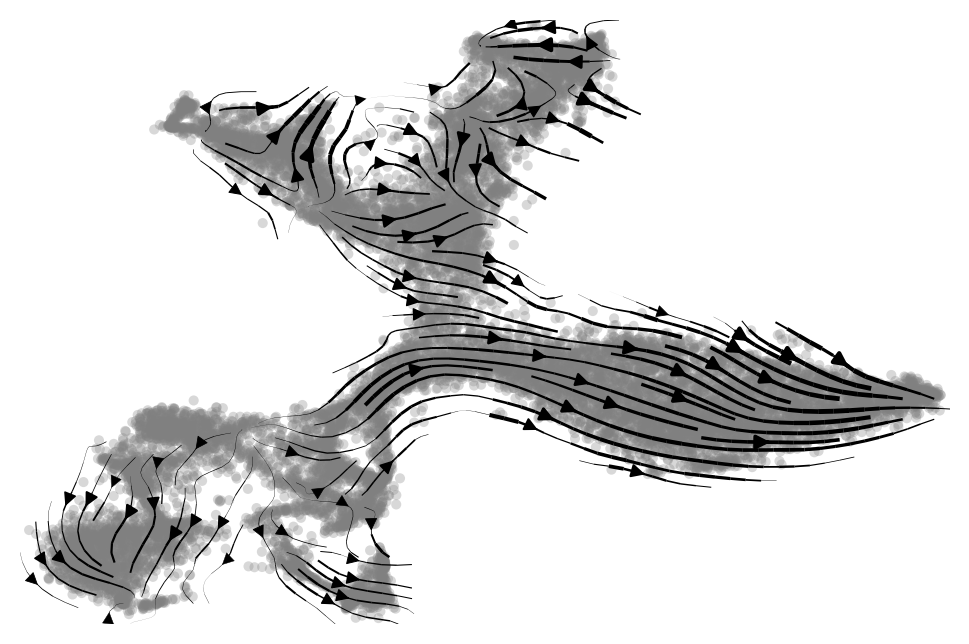

In [154]:
scv.pl.velocity_embedding_stream(adata_branch, vkey='dynamical_velocity', dpi=200)

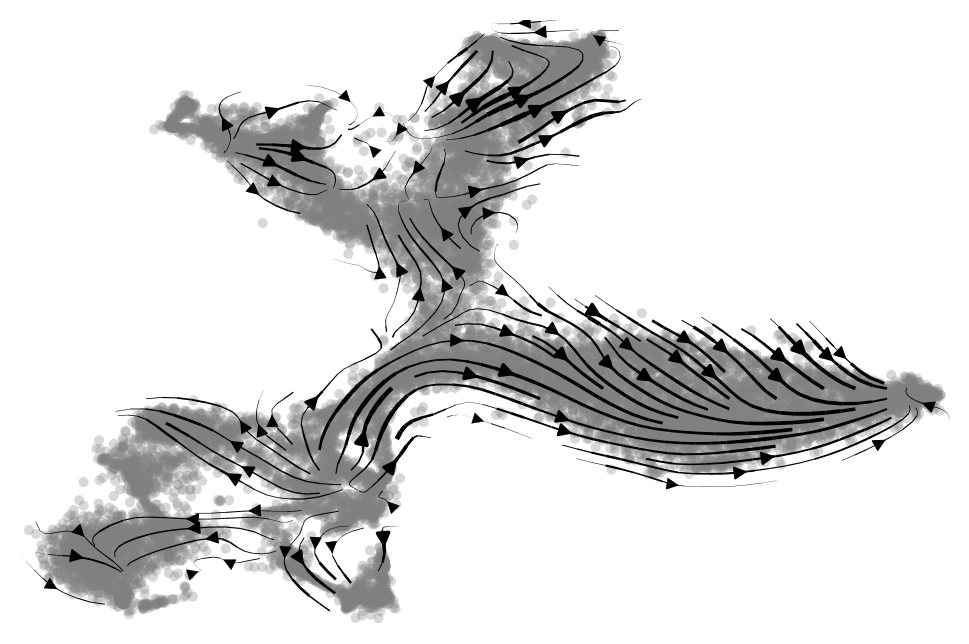

In [155]:
scv.pl.velocity_embedding_stream(adata_branch, vkey='steady_state_velocity', dpi=200)


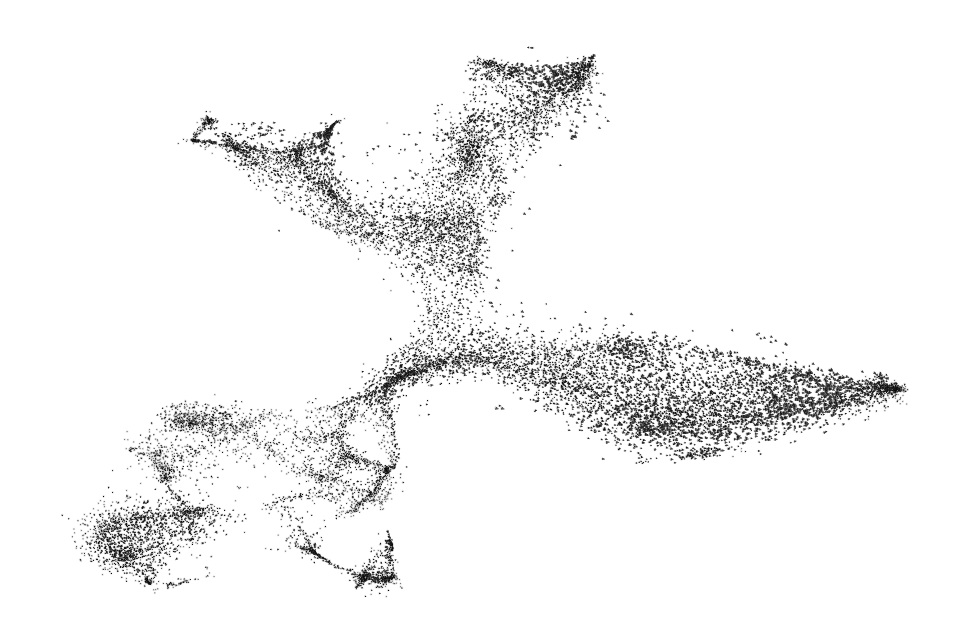

In [156]:
X_dynamic,V_dynamic=scv.pl.velocity_embedding(adata_branch, vkey='dynamical_velocity', scale=0.5, dpi=200)

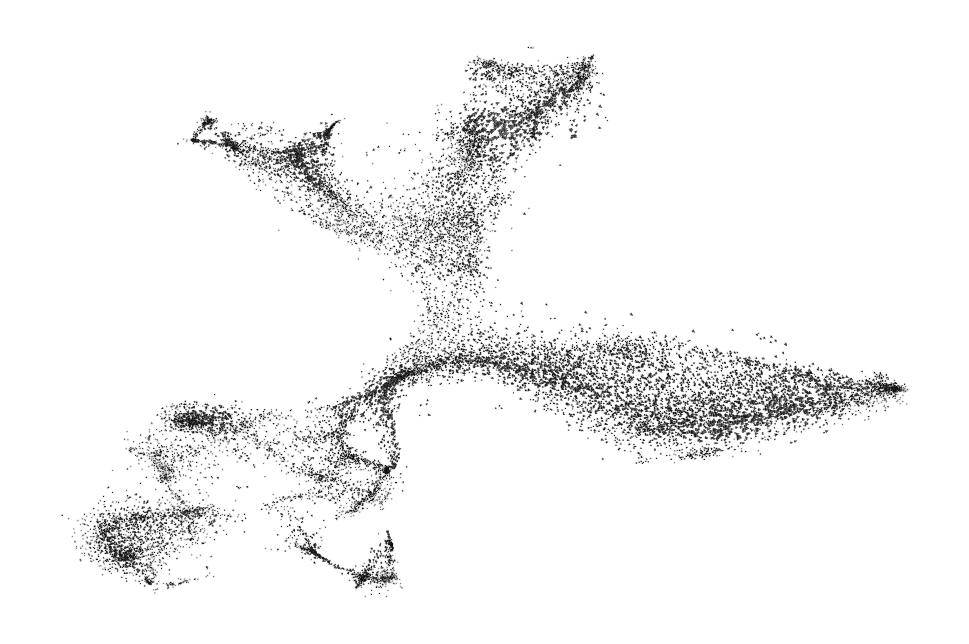

In [157]:
X_steady,V_steady=scv.pl.velocity_embedding(adata_branch, vkey='steady_state_velocity', scale=0.5, dpi=200)

In [92]:
scv_cell_velocity_dy=pd.DataFrame({'embedding1':X_dynamic[:,0],'embedding2':X_dynamic[:,1],'embedding1_scv':V_dynamic[:,0],'embedding2_scv':V_dynamic[:,1]})
scv_cell_velocity_st=pd.DataFrame({'embedding1':X_steady[:,0],'embedding2':X_steady[:,1],'embedding1_scv':V_steady[:,0],'embedding2_scv':V_steady[:,1]})

In [93]:
scv_cell_velocity_dy.to_csv('/Users/wanglab/Documents/ShengyuLi/Velocity/data/neuro/scvelo_prediction/cell_velocity_scv_dy.csv',index=False)
scv_cell_velocity_st.to_csv('/Users/wanglab/Documents/ShengyuLi/Velocity/data/neuro/scvelo_prediction/scv_cell_velocity_st.csv',index=False)

In [94]:
from celldancer.sampling import sampling_neighbors
from sklearn.neighbors import NearestNeighbors
# load raw
raw_data_path = "/Users/wanglab/Documents/ShengyuLi/Velocity/data/raw_data/DentateGyrus.csv"
load_raw_data = pd.read_csv(raw_data_path)

0.4229539132771963
1.6649887814107416
3.936572588984508


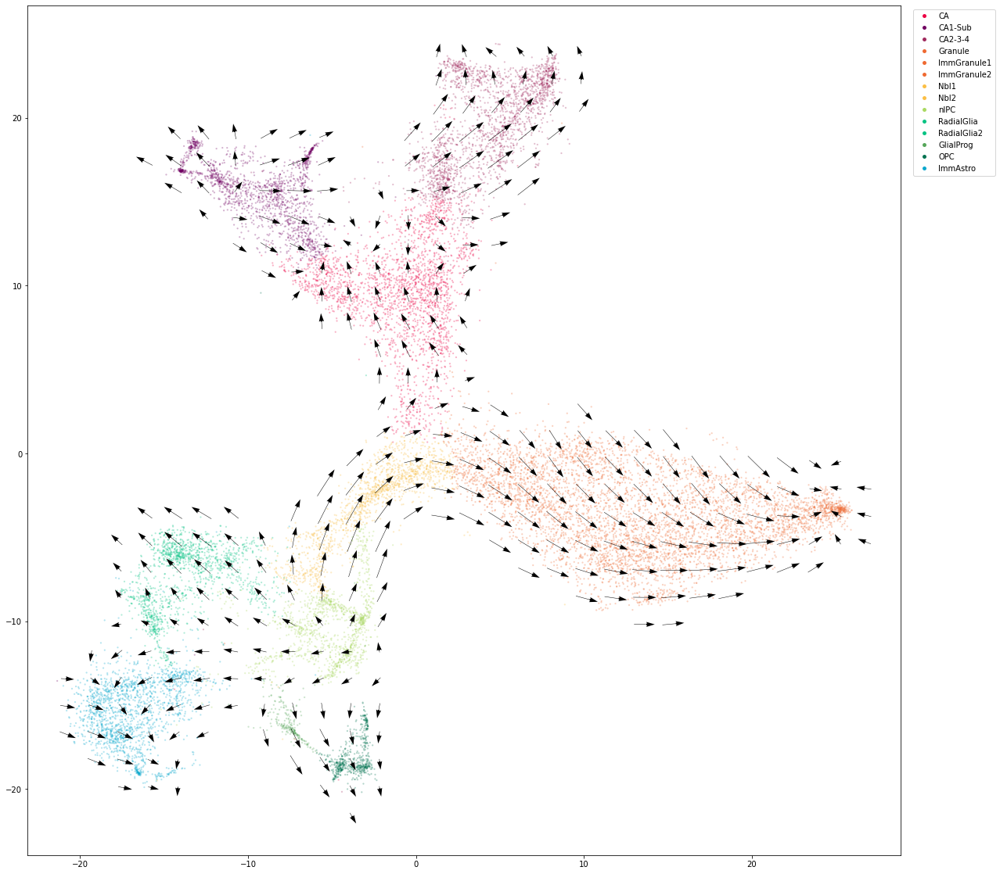

In [160]:
colors = colormap.colormap_neuro
import os
# save_path='/Users/wanglab/Documents/ShengyuLi/Velocity/data/Gastrulation/velocity_result/scvelo/cell_velocity'
save_path='/Users/wanglab/Documents/ShengyuLi/Velocity/data/neuro/scvelo_prediction'

velocity_cell_map_curve_scv(X_steady[X_steady[:,1] >-100],V_steady[X_steady[:,1] >-100], X_steady[:,1]>-100,load_raw_data,colors=colors,min_mass=13,grid_steps=(30,30),alpha_inside=0.3,save_path=save_path)

0.4049928018866708
1.6649887814107416
4.111156478965411


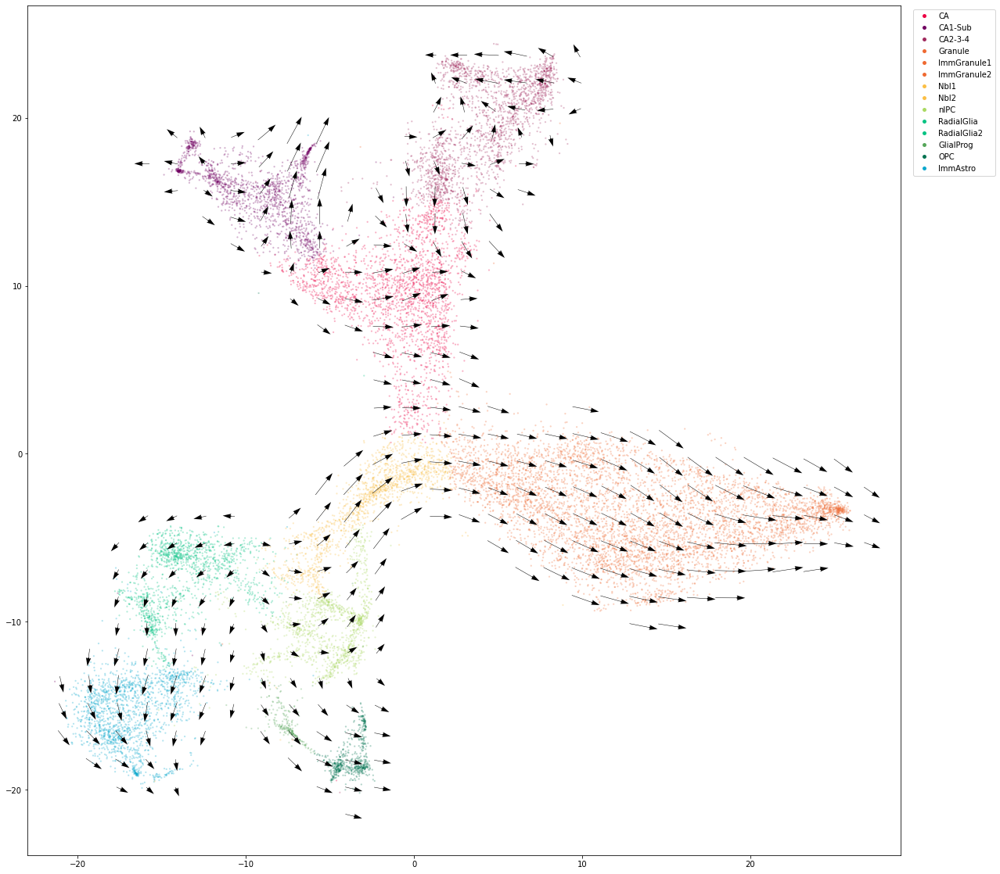

In [161]:
colors = colormap.colormap_neuro
import os
# save_path='/Users/wanglab/Documents/ShengyuLi/Velocity/data/Gastrulation/velocity_result/scvelo/cell_velocity'
save_path='/Users/wanglab/Documents/ShengyuLi/Velocity/data/neuro/scvelo_prediction'

velocity_cell_map_curve_scv(X_dynamic[X_dynamic[:,1] >-100],V_dynamic[X_dynamic[:,1] >-100], X_dynamic[:,1]>-100,load_raw_data,colors=colors,min_mass=13,grid_steps=(30,30),alpha_inside=0.3,save_path=save_path)

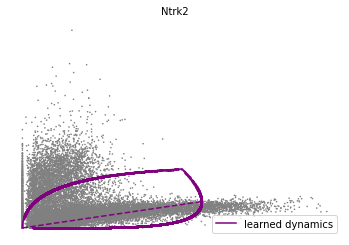

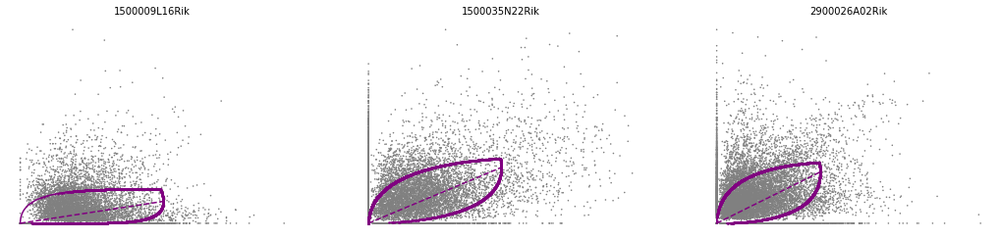

In [184]:
kwargs = dict(frameon=False, size=10, linewidth=1.5)
scv.pl.scatter(adata_branch, ['Ntrk2'], **kwargs)

scv.pl.scatter(adata_branch, branch_genes[0:3], **kwargs)

In [107]:
        
    def velocity_cell_map_curve_scv(embedding,velocity_embedding, idx,load_raw_data,n_neighbors=200,add_amt_gene=2000,step=(60,60),save_path=None, save_csv=None,gene_list=None, custom_xlim=None,custom_ylim=None,colors=None,mode='embedding',pca_n_components=4,file_name_additional_info='',umap_n=10,transfer_mode=None,umap_n_components=None,min_mass=2,grid_steps=(30,30),alpha_inside=0.5):
      #  from get_embedding import get_embedding

        """Cell velocity plot.

        TO DO: load_raw_data contains the cluster information, needs improve
        
        .. image:: https://user-images.githubusercontent.com/31883718/67709134-a0989480-f9bd-11e9-8ae6-f6391f5d95a0.png
        

        Arguments
        ---------
        adata: :class:`~anndata.AnnData`
            Annotated data matrix.
        density: `float` (default: 1)
            Amount of velocities to show - 0 none to 1 all
        arrow_size: `float` or triple `headlength, headwidth, headaxislength` (default: 1)
            Size of arrows.
        arrow_length: `float` (default: 1)
            Length of arrows.
        scale: `float` (default: 1)
            Length of velocities in the embedding.
        {scatter}

        Returns
        -------
        `matplotlib.Axis` if `show==False`
        """

        # embedding, sampling_ixs, velocity_embedding=get_embedding(load_raw_data,load_cellDancer,gene_list=gene_list,n_neighbors=n_neighbors,step=step,mode=mode,pca_n_components=pca_n_components,umap_n=umap_n,transfer_mode=transfer_mode,umap_n_components=umap_n_components)
        # embedding
        sampling_ixs=range(embedding.shape[0])

        
        if colors is not None:
            colors=colors
        else:
            colors = {'CA': grove2[7],
                    'CA1-Sub': grove2[9],
                    'CA2-3-4': grove2[8],
                    'Granule': grove2[6],
                    'ImmGranule1': grove2[6],
                    'ImmGranule2': grove2[6],
                    'Nbl1': grove2[5],
                    'Nbl2': grove2[5],
                    'nIPC': grove2[4],
                    'RadialGlia': grove2[3],
                    'RadialGlia2': grove2[3],
                    'GlialProg': grove2[2],
                    'OPC': grove2[1],
                    'ImmAstro': grove2[0]}
        pointsize = 5

        one_gene_raw = load_raw_data.gene_name[0]
        
        step_i = 25
        step_j = 25
        from matplotlib.patches import Patch
        from matplotlib.lines import Line2D

        def gen_Line2D(label, markerfacecolor):
            return Line2D([0], [0], color='w', marker='o', label=label, markerfacecolor=markerfacecolor,  markeredgewidth=0, markersize=5)

        legend_elements = []
        for i in colors:
            legend_elements.append(gen_Line2D(i, colors[i]))

        arrow_idx = sampling_neighbors(
            embedding[sampling_ixs, :], step=(step_i, step_j))
        
        fig, ax = plt.subplots(figsize=(20,20))


        plt.scatter(embedding[:, 0],
                    embedding[:, 1],
                    c=load_raw_data[load_raw_data.gene_name ==
                                    one_gene_raw]['clusters'].loc[idx].map(colors),
                    s=pointsize,
                    # alpha=1,
                    # alpha=0.3,
                    # alpha=0.05,
                    alpha=alpha_inside,
                    edgecolor="none")

        # arrow all points

        # calculate_grid_arrows
        # Source - https://github.com/velocyto-team/velocyto.py/blob/0963dd2df0ac802c36404e0f434ba97f07edfe4b/velocyto/analysis.py
        def grid_curve(embedding, sampling_ixs, velocity_embedding):
            from scipy.stats import norm as normal
            import bezier
            # kernel grid plot

            def calculate_two_end_grid(embedding, sampling_ixs, velocity_embedding, smooth=None, steps=None, min_mass=None):
                def find_neighbors(data, n_neighbors, gridpoints_coordinates):
                    # data  = embedding[sampling_ixs, :]
                    nn = NearestNeighbors(
                        n_neighbors=n_neighbors, n_jobs=8)
                    nn.fit(data)
                    dists, neighs = nn.kneighbors(gridpoints_coordinates)
                    return(dists, neighs)
                # Prepare the grid
                grs = []
                for dim_i in range(embedding[sampling_ixs, :].shape[1]):
                    m, M = np.min(embedding[sampling_ixs, :][:, dim_i]) - \
                        0.2, np.max(
                            embedding[sampling_ixs, :][:, dim_i])-0.2
                    m = m - 0.025 * np.abs(M - m)
                    M = M + 0.025 * np.abs(M - m)
                    gr = np.linspace(m, M, steps[dim_i])
                    grs.append(gr)

                meshes_tuple = np.meshgrid(*grs)
                gridpoints_coordinates = np.vstack(
                    [i.flat for i in meshes_tuple]).T

                n_neighbors = int(velocity_embedding.shape[0]/3)
                dists_head, neighs_head = find_neighbors(
                    embedding[sampling_ixs, :], n_neighbors, gridpoints_coordinates)
                dists_tail, neighs_tail = find_neighbors(
                    embedding[sampling_ixs, :]+velocity_embedding, n_neighbors, gridpoints_coordinates)
                std = np.mean([(g[1] - g[0]) for g in grs])

                # isotropic gaussian kernel
                gaussian_w_head = normal.pdf(
                    loc=0, scale=smooth * std, x=dists_head)
                total_p_mass_head = gaussian_w_head.sum(1)
                gaussian_w_tail = normal.pdf(
                    loc=0, scale=smooth * std, x=dists_tail)
                total_p_mass_tail = gaussian_w_tail.sum(1)

                UZ_head = (velocity_embedding[neighs_head] * gaussian_w_head[:, :, None]).sum(
                    1) / np.maximum(1, total_p_mass_head)[:, None]  # weighed average
                UZ_tail = (velocity_embedding[neighs_tail] * gaussian_w_tail[:, :, None]).sum(
                    1) / np.maximum(1, total_p_mass_tail)[:, None]  # weighed average

                XY = gridpoints_coordinates

                dists_head2, neighs_head2 = find_neighbors(
                    embedding[sampling_ixs, :], n_neighbors, XY+UZ_head)
                dists_tail2, neighs_tail2 = find_neighbors(
                    embedding[sampling_ixs, :], n_neighbors, XY-UZ_tail)

                gaussian_w_head2 = normal.pdf(
                    loc=0, scale=smooth * std, x=dists_head2)
                total_p_mass_head2 = gaussian_w_head2.sum(1)
                gaussian_w_tail2 = normal.pdf(
                    loc=0, scale=smooth * std, x=dists_tail2)
                total_p_mass_tail2 = gaussian_w_tail2.sum(1)

                UZ_head2 = (velocity_embedding[neighs_head2] * gaussian_w_head2[:, :, None]).sum(
                    1) / np.maximum(1, total_p_mass_head2)[:, None]  # weighed average
                UZ_tail2 = (velocity_embedding[neighs_tail2] * gaussian_w_tail2[:, :, None]).sum(
                    1) / np.maximum(1, total_p_mass_tail2)[:, None]  # weighed average

                mass_filter = total_p_mass_head < min_mass

                # filter dots
                UZ_head_filtered = UZ_head[~mass_filter, :]
                UZ_tail_filtered = UZ_tail[~mass_filter, :]
                UZ_head2_filtered = UZ_head2[~mass_filter, :]
                UZ_tail2_filtered = UZ_tail2[~mass_filter, :]
                XY_filtered = XY[~mass_filter, :]
                return(XY_filtered, UZ_head_filtered, UZ_tail_filtered, UZ_head2_filtered, UZ_tail2_filtered, mass_filter, grs)

            XY_filtered, UZ_head_filtered, UZ_tail_filtered, UZ_head2_filtered, UZ_tail2_filtered, mass_filter, grs = calculate_two_end_grid(
                embedding, sampling_ixs, velocity_embedding, smooth=0.8, steps=grid_steps, min_mass=min_mass)

            # plt.quiver(XY_filtered[:, 0], XY_filtered[:, 1], UZ_head_filtered[:, 0], UZ_head_filtered[:, 1], zorder=20000, color='blue')
            # plt.quiver(XY_filtered[:, 0]-UZ_tail_filtered[:, 0], XY_filtered[:, 1]-UZ_tail_filtered[:, 1], UZ_tail_filtered[:, 0], UZ_tail_filtered[:, 1], zorder=20000, color='red')
            # plt.savefig('/Users/shengyuli/Library/CloudStorage/OneDrive-HoustonMethodist/work/Velocity/data/velocyto/neuro/detailcsv/cost_v1_all_gene/cell_velocity/two_end.pdf')

            #######################################################
            ############ connect two end grid to curve ############
            #######################################################
            n_curves = XY_filtered.shape[0]
            s_vals = np.linspace(0.0, 1.5, 15)
            ############ get longest distance len and norm ratio ############
            XYM = XY_filtered
            UVT = UZ_tail_filtered
            UVH = UZ_head_filtered
            UVT2 = UZ_tail2_filtered
            UVH2 = UZ_head2_filtered

            def norm_arrow_display_ratio(XYM, UVT, UVH, UVT2, UVH2, grs, s_vals):
                '''get the longest distance in prediction between the five points,
                and normalize by using the distance between two grids'''

                def distance(x, y):
                    # calc disctnce list between a set of coordinate
                    calculate_square = np.subtract(
                        x[0:-1], x[1:])**2 + np.subtract(y[0:-1], y[1:])**2
                    distance_result = (calculate_square)**0.5
                    return distance_result

                max_discance = 0
                for i in range(n_curves):
                    nodes = np.asfortranarray([[XYM[i, 0]-UVT[i, 0]-UVT2[i, 0], XYM[i, 0]-UVT[i, 0], XYM[i, 0], XYM[i, 0]+UVH[i, 0], XYM[i, 0]+UVH[i, 0]+UVH2[i, 0]],
                                                [XYM[i, 1]-UVT[i, 1]-UVT2[i, 1], XYM[i, 1]-UVT[i, 1], XYM[i, 1], XYM[i, 1]+UVH[i, 1], XYM[i, 1]+UVH[i, 1]+UVH2[i, 1]]])
                    curve = bezier.Curve(nodes, degree=4)
                    curve_dots = curve.evaluate_multi(s_vals)
                    distance_sum = np.sum(
                        distance(curve_dots[0], curve_dots[1]))
                    max_discance = max(max_discance, distance_sum)
                distance_grid = (
                    abs(grs[0][0]-grs[0][1]) + abs(grs[1][0]-grs[1][1]))/2
                print(max_discance)
                print(distance_grid)
                norm_ratio = distance_grid/max_discance
                print(norm_ratio)
                return(norm_ratio)

            norm_ratio = norm_arrow_display_ratio(
                XYM, UVT, UVH, UVT2, UVH2, grs, s_vals)
            ############ end --- get longest distance len and norm ratio ############

            ############ plot the curve arrow for cell velocity ############

            XYM = XY_filtered
            UVT = UZ_tail_filtered * norm_ratio
            UVH = UZ_head_filtered * norm_ratio
            UVT2 = UZ_tail2_filtered * norm_ratio
            UVH2 = UZ_head2_filtered * norm_ratio

            def plot_cell_velocity_curve(XYM, UVT, UVH, UVT2, UVH2, s_vals):
                plt.axis('equal')
                # TO DO: add 'colorful cell velocity' to here, now there is only curve arrows
                for i in range(n_curves):
                    nodes = np.asfortranarray([[XYM[i, 0]-UVT[i, 0]-UVT2[i, 0], XYM[i, 0]-UVT[i, 0], XYM[i, 0], XYM[i, 0]+UVH[i, 0], XYM[i, 0]+UVH[i, 0]+UVH2[i, 0]],
                                                [XYM[i, 1]-UVT[i, 1]-UVT2[i, 1], XYM[i, 1]-UVT[i, 1], XYM[i, 1], XYM[i, 1]+UVH[i, 1], XYM[i, 1]+UVH[i, 1]+UVH2[i, 1]]])
                    curve = bezier.Curve(nodes, degree=4)
                    curve_dots = curve.evaluate_multi(s_vals)
                    plt.plot(curve_dots[0], curve_dots[1],
                                linewidth=0.5, color='black', alpha=1)

                    # normalize the arrow of the last two points at the tail, to let all arrows has the same size in quiver
                    U = curve_dots[0][-1]-curve_dots[0][-2]
                    V = curve_dots[1][-1]-curve_dots[1][-2]
                    N = np.sqrt(U**2 + V**2)
                    U1, V1 = U/N*0.5, V/N*0.5  # 0.5 is to let the arrow have a suitable size
                    plt.quiver(curve_dots[0][-2], curve_dots[1][-2], U1, V1, units='xy', angles='xy',
                                scale=1, linewidth=0, color='black', alpha=1, minlength=0, width=0.1)

                # used to help identify arrow and line
                # plt.quiver(XY_filtered[:, 0], XY_filtered[:, 1], UZ_head_filtered[:, 0], UZ_head_filtered[:, 1], zorder=20000, color='blue',linewidth=0,alpha=0.2)
                # plt.quiver(XY_filtered[:, 0]-UZ_tail_filtered[:, 0], XY_filtered[:, 1]-UZ_tail_filtered[:, 1], UZ_tail_filtered[:, 0], UZ_tail_filtered[:, 1], zorder=20000, color='red',alpha=0.2)

            plot_cell_velocity_curve(XYM, UVT, UVH, UVT2, UVH2, s_vals)
            ############ end --- plot the curve arrow for cell velocity ############

        grid_curve(embedding, sampling_ixs, velocity_embedding)


        if custom_xlim is not None:
            plt.xlim(custom_xlim[0], custom_xlim[1])
            # plt.xlim(-23, 45) # for neurn dataset
        if custom_ylim is not None:
            plt.ylim(custom_ylim[0], custom_ylim[1])
        
        lgd=plt.legend(handles=legend_elements, bbox_to_anchor=(1.01, 1), loc='upper left')
        # plt.show()
        
        if save_path is not None:
            plt.savefig(os.path.join(save_path,('velocity_embedding_scv_colorful_grid_curve_arrow.pdf')),bbox_inches='tight',bbox_extra_artists=(lgd,),)
        if save_csv is not None:
            cell_velocity_df=pd.DataFrame({'embedding1':embedding[sampling_ixs, 0],
                         'embedding2':embedding[sampling_ixs, 1],
                         ('embedding1_n'+str(n_neighbors)+'_gAmt'+str(add_amt_gene)):velocity_embedding[:, 0],
                         ('embedding2_n'+str(n_neighbors)+'_gAmt'+str(add_amt_gene)):velocity_embedding[:, 1]})
            cell_velocity_df.to_csv(os.path.join(save_path,('velocity_embedding_tune_n' + \
            str(n_neighbors)+'_gAmt'+str(add_amt_gene) + \
            file_name_additional_info + \
            '_colorful_grid_curve_arrow.csv')))

In [40]:
# gene_list=['Smim1','Hba-x','Myo1b','Rbms2','Skap1','Tpd52l1',
#           'Cpox','Smarca2','Yipf5',
#           'Gclm','Mllt3','Nfkb1','Phc2', 'Snca','Sulf2','Tspan9',
#           'Blvrb','Coro2b','Dlc1','Etv6','Xiap']
gene_list=adata.var_names.copy()

In [41]:
gene_list

Index(['Mgst3', 'Ppox', 'Creg1', 'Slc30a10', 'Nudt4', 'Chchd10', 'Arid3a',
       'Dhrs11', 'Slc4a1', 'Dcxr', 'Hba-x', 'Hba-a2', 'Slc25a21', 'Glrx5',
       'Rfesd', 'Tmem14c', 'Ell2', 'Slc25a37', 'Ctsb', 'Ncf4', 'Prr13', 'Tfrc',
       'Cpox', 'Cdc42ep3', 'Pim1', 'Rhag', 'Celf4', 'Fech', 'Cdc25b',
       'Fam210b', 'Pklr', 'Gstm5', 'Gclm', 'Hemgn', 'Alad', 'Mllt3', 'Smim1',
       'Rragd', 'Tmod1', 'Svbp', 'Asns', 'Hebp1', 'Arf5', 'Bpgm', 'Abcg2',
       'Cox6b2', 'Ftl1', 'Hbb-bt', 'Hbb-bh1', 'Hbb-y', 'Kcnn4', 'Blvrb',
       'Aqp8', 'Abcb10', 'Gypa', 'Klf1', 'Prdx2', 'Nxpe2', 'Icam4', 'Gpx1',
       'Alas2'],
      dtype='object', name='index')

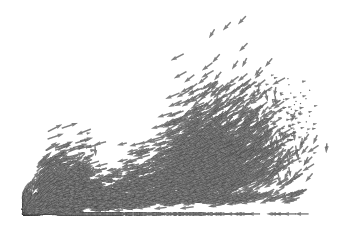

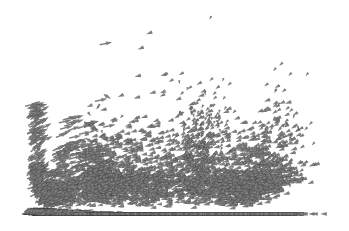

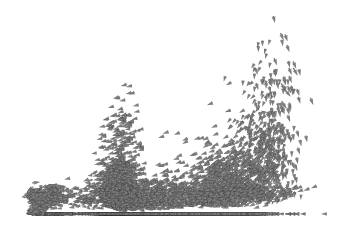

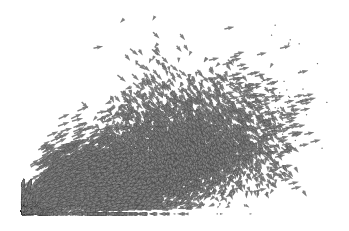

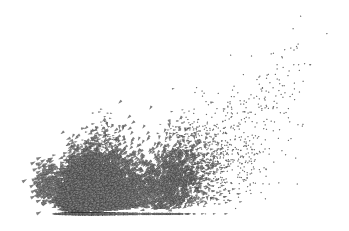

...

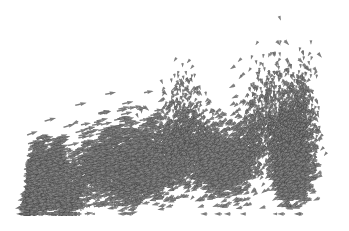

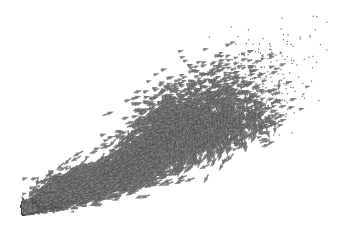

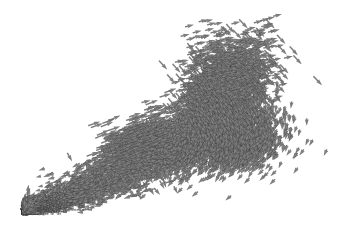

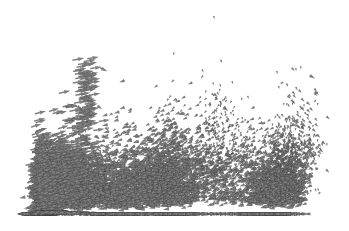

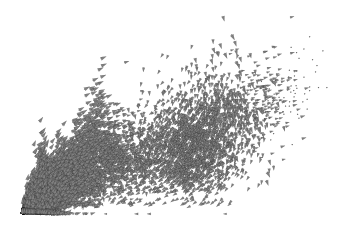

In [51]:
gene_velocity_fin=pd.DataFrame()
for gene in gene_list:
    # s0u0,s1u1=scv.pl.velocity_embedding(adata, vkey='steady_state_velocity', basis=gene,
    #                           scale=4, width=.0035, frameon=False, title='')
    s0u0,s1u1=scv.pl.velocity_embedding(adata, vkey='dynamical_velocity', basis=gene, scale=4, width=.0035,
                             frameon=False, title='')
    
    gene_velocity=pd.DataFrame({'gene_name':gene,'s0':s0u0[:,0],'u0':s0u0[:,1],'s1':s1u1[:,0],'u1':s1u1[:,1]})
    gene_velocity_fin=gene_velocity_fin.append(gene_velocity)

In [52]:
gene_velocity_fin=gene_velocity_fin.reset_index(drop=True)

In [53]:
gene_velocity_fin.s1=gene_velocity_fin.s0+gene_velocity_fin.s1
gene_velocity_fin.u1=gene_velocity_fin.u0+gene_velocity_fin.u1

In [54]:
gene_velocity_fin

,gene_name,s0,u0,s1,u1
0,Mgst3,0.119450,0.000000,3.528206,0.005775
1,Mgst3,0.097280,0.000000,0.000000,0.000000
2,Mgst3,0.107186,0.000000,1.197137,0.001534
3,Mgst3,0.402772,0.000000,0.000000,0.000000
4,Mgst3,0.202537,0.000000,0.000000,0.000000
...,...,...,...,...,...
752064,Alas2,5.450834,0.054983,5.194057,0.043090
752065,Alas2,6.200462,0.036798,5.749766,0.027570
752066,Alas2,5.794872,0.031082,5.335432,0.022020
752067,Alas2,5.638885,0.026151,5.151584,0.017679


In [55]:
celltype=pd.concat([adata.obs['celltype']]*len(gene_list)).reset_index()

In [56]:
scv_velocity_sample_genes=pd.concat([gene_velocity_fin,celltype], axis=1)

In [57]:
scv_velocity_sample_genes

,gene_name,s0,u0,s1,u1,index,celltype
0,Mgst3,0.119450,0.000000,3.528206,0.005775,cell_363,Blood progenitors 2
1,Mgst3,0.097280,0.000000,0.000000,0.000000,cell_382,Blood progenitors 2
2,Mgst3,0.107186,0.000000,1.197137,0.001534,cell_385,Blood progenitors 2
3,Mgst3,0.402772,0.000000,0.000000,0.000000,cell_393,Blood progenitors 2
4,Mgst3,0.202537,0.000000,0.000000,0.000000,cell_398,Blood progenitors 2
...,...,...,...,...,...,...,...
752064,Alas2,5.450834,0.054983,5.194057,0.043090,cell_139318,Erythroid3
752065,Alas2,6.200462,0.036798,5.749766,0.027570,cell_139321,Erythroid3
752066,Alas2,5.794872,0.031082,5.335432,0.022020,cell_139326,Erythroid3
752067,Alas2,5.638885,0.026151,5.151584,0.017679,cell_139327,Erythroid3


In [61]:
# scv_velocity_sample_genes.to_csv('/Users/wanglab/Documents/ShengyuLi/Velocity/data/Gastrulation/velocity_result/scvelo/gene_velocity_murk/static/scv_static_gene_velocity.csv')
# scv_velocity_sample_genes.to_csv('/Users/wanglab/Documents/ShengyuLi/Velocity/data/Gastrulation/velocity_result/scvelo/gene_velocity_murk/dynamic/scv_dynamic_gene_velocity.csv')
scv_velocity_sample_genes=pd.read_csv('/Users/wanglab/Documents/ShengyuLi/Velocity/data/Gastrulation/velocity_result/scvelo/gene_velocity_murk/static/scv_static_gene_velocity.csv')

In [62]:
from colormap import *
from velocity_plot import velocity_plot as vpl
# gene velocity plot
color_list=solarExtra02.copy()

colors = {
'Haematoendothelial progenitors':color_list[0],
'Blood progenitors 1':color_list[1],
'Blood progenitors 2':color_list[2],
'Erythroid1':color_list[3],
'Erythroid2':color_list[4],
'Erythroid3':color_list[5]}


one_gene_raw=scv_velocity_sample_genes[scv_velocity_sample_genes.gene_name==scv_velocity_sample_genes.gene_name.iloc[0]]
cluster_info=one_gene_raw['celltype']
# save_dir='/Users/wanglab/Documents/ShengyuLi/Velocity/data/Gastrulation/velocity_result/scvelo/picked_predict_good_in_celldancer/scvelo_static_gene_velocity_comparable_samples/'
# save_dir='/Users/wanglab/Documents/ShengyuLi/Velocity/data/Gastrulation/velocity_result/scvelo/gene_velocity_murk/dynamic/'
save_dir='/Users/wanglab/Documents/ShengyuLi/Velocity/data/Gastrulation/velocity_result/scvelo/gene_velocity_murk/static/'




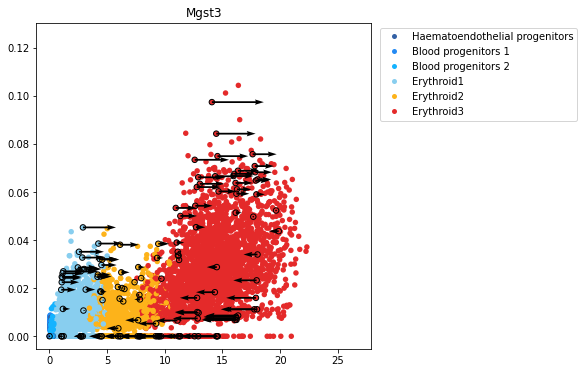

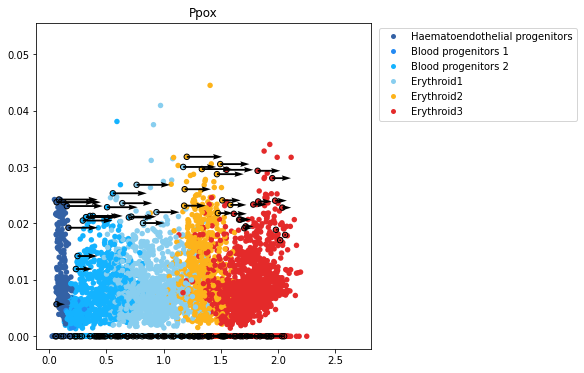

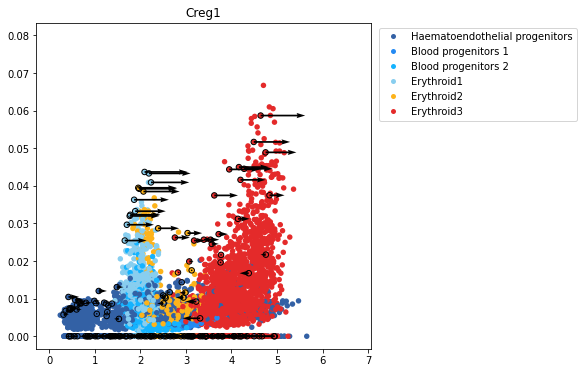

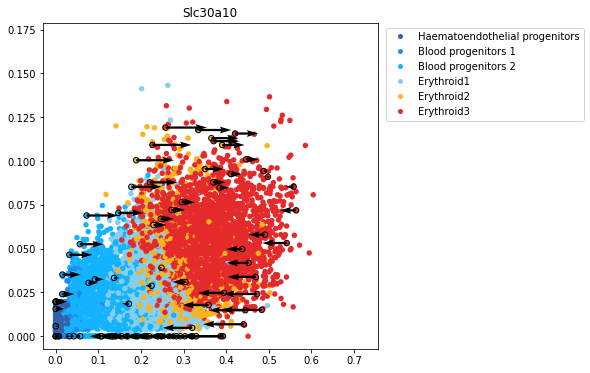

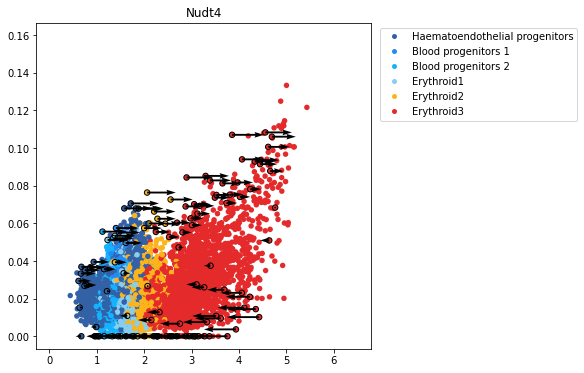

...

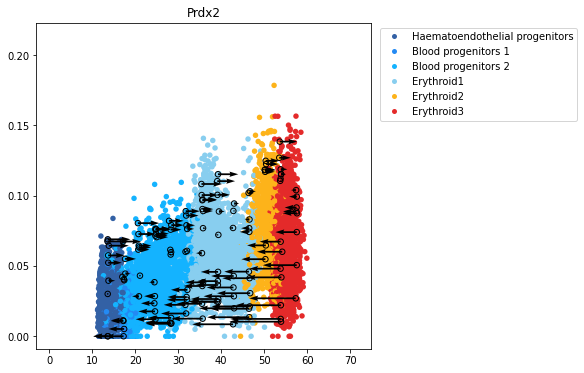

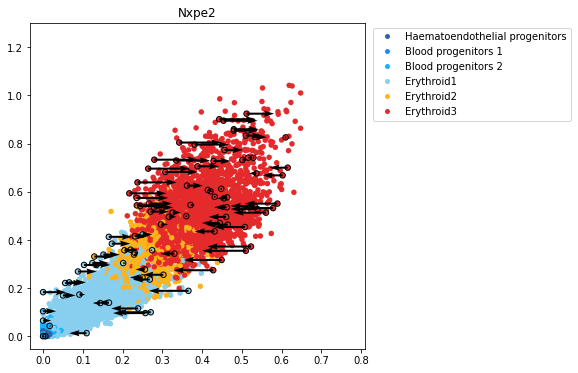

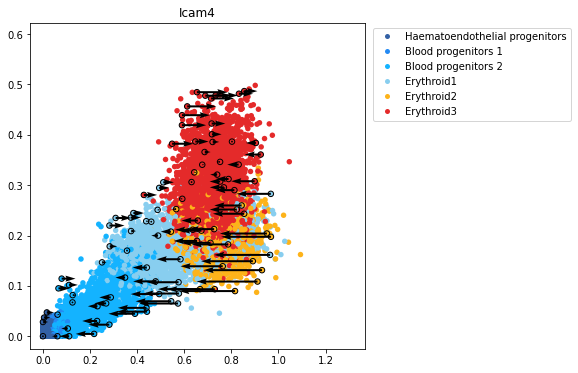

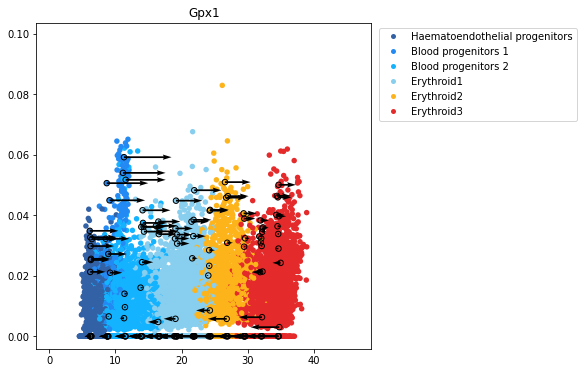

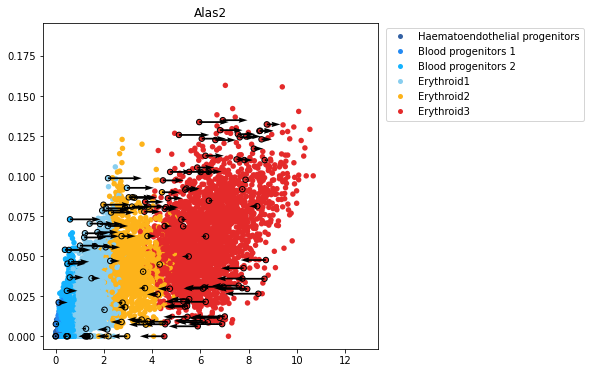

In [63]:
for gene in gene_list:
    vpl.velocity_gene(gene,scv_velocity_sample_genes,colors=colors,mode='cluster',cluster_annot=True,cluster_info=cluster_info,point_size=30,alpha_inside=1,save_path=save_dir+gene+'.pdf')